### Setup Environment:

In [1]:
from src.get_dataset import get_dataset, split_data
from src.data_loader import BRSETDataset, process_labels
from src.RetFound import get_retfound
from src.FocalLoss import FocalLoss
from src.model import FoundationalCVModel, FoundationalCVModelWithClassifier
from sklearn.utils.class_weight import compute_class_weight

import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader

from src.train import train
from src.test import test

In [2]:
# Constants:
DATASET = '/home/opc/Retina/BRSET/'
LABELS_PATH = os.path.join(DATASET, 'labels.csv')
IMAGES = os.path.join(DATASET, 'images/')
DOWNLOAD = False
SHAPE = (224, 224)
LABEL = 'DR_ICDR'
IMAGE_COL = 'image_id'
TEST_SIZE = 0.3
UNDERSAMPLE = False

"""
Dataset Mean and Std:
NORM_MEAN = [0.5896205017400412, 0.29888971649817453, 0.1107679405196557]
NORM_STD = [0.28544273712830986, 0.15905456049750208, 0.07012281660980953]

ImageNet Mean and Std:
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD = [0.229, 0.224, 0.225]
"""

NORM_MEAN = None # [0.485, 0.456, 0.406]
NORM_STD = None # [0.229, 0.224, 0.225]

BACKBONE = 'convnextv2_large'
MODE = 'fine_tune'
backbone_mode= 'fine_tune' # 'fine_tune'

HIDDEN = [128]
num_classes = 3

BATCH_SIZE = 16
NUM_WORKERS = 4

LOSS = None #'focal_loss'
OPTIMIZER = 'adam'

# Define your hyperparameters
num_epochs = 50
learning_rate = 1e-5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


#### Read csv file:

In [3]:
df = get_dataset(DATASET, download=DOWNLOAD, info=False)
df.head()

loading csv file in /home/opc/Retina/BRSET//labels.csv


,image_id,patient_id,camera,patient_age,comorbidities,diabetes_time_y,insuline,patient_sex,exam_eye,diabetes,...,vascular_occlusion,hypertensive_retinopathy,drusens,hemorrhage,retinal_detachment,myopic_fundus,increased_cup_disc,other,quality,normality
0,img00001,1,Canon CR,48.0,diabetes1,12,yes,1,1,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
1,img00002,1,Canon CR,48.0,diabetes1,12,yes,1,2,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
2,img00003,2,Canon CR,18.0,diabetes1,7,yes,2,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
3,img00004,2,Canon CR,18.0,diabetes1,7,yes,2,2,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
4,img00005,3,Canon CR,22.0,diabetes1,11,yes,1,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal


In [4]:
# Convert into 3 classes:

# Normal = 0; Non-proliferative = 1, 2, 3; Proliferative = 4
# Map values to categories
df[LABEL] = df[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))

Train data shape: (11386, 35)
Test data shape: (4880, 35)


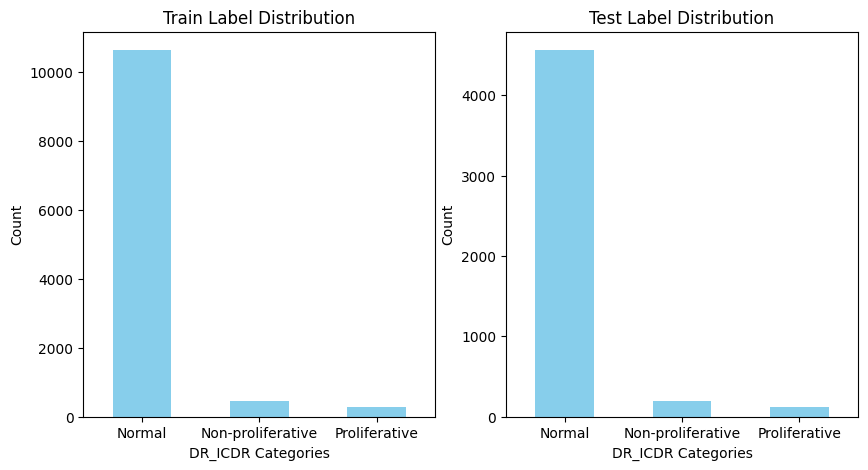

Getting validation set...
Train data shape: (3904, 35)
Test data shape: (976, 35)


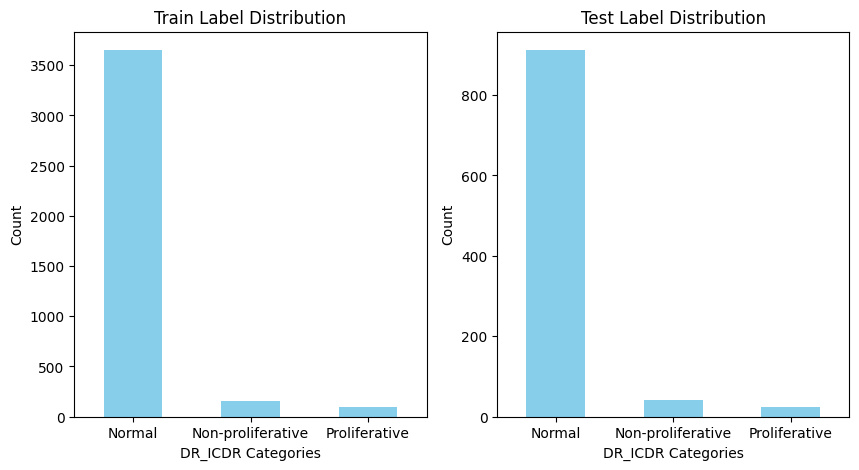

In [5]:
# Split dataset into train, test and validation:
df_train, df_test = split_data(df, LABEL, TEST_SIZE, undersample=False)
print('Getting validation set...')
df_test, df_val = split_data(df_test, LABEL, 0.20)

### Dataloaders

In [6]:
# Train the one hot encoder on the train set and get the labels for the test and validation sets:
train_labels, mlb, train_columns = process_labels(df_train, col=LABEL)

In [7]:
# Define the target image shape

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(SHAPE),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(50),  # Randomly rotate the image by up to 10 degrees
])

if NORM_MEAN is not None and NORM_STD is not None:
    train_transforms.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

test_transform = transforms.Compose([
    transforms.Resize(SHAPE),
    transforms.ToTensor(),
])

if NORM_MEAN is not None and NORM_STD is not None:
    test_transform.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

In [8]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

In [9]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

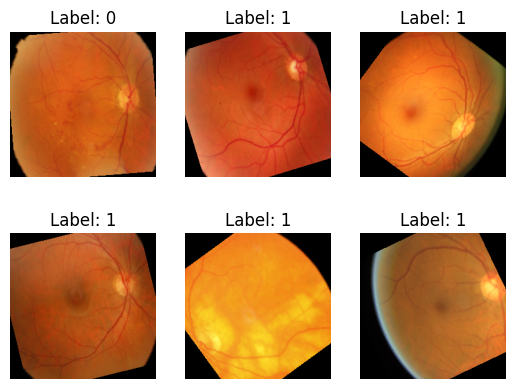

In [10]:
# Print 6 samples with their labels
# Iterate through the DataLoader and plot the images with labels

for batch in train_dataloader:

    images, labels = batch['image'], batch['labels']

    for i in range(len(images)):
        if i == 6:
            break
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].permute(1, 2, 0))  # Permute to (H, W, C) from (C, H, W)
        plt.title(f"Label: {np.argmax(labels[i])}")
        plt.axis('off')
    plt.show()
    break

### Model

In [11]:
# Create a DataLoader to generate embeddings
#model = get_retfound(weights='/home/opc/FoundationalRetina/Weights/RETFound_cfp_weights.pth', num_classes=3)
# Create a DataLoader to generate embeddings
backbone_model = FoundationalCVModel(backbone=BACKBONE, mode=MODE)
model = FoundationalCVModelWithClassifier(backbone_model, hidden=HIDDEN, num_classes=num_classes, mode=MODE, backbone_mode=backbone_mode)
model.to(device)

# Use DataParallel to parallelize the model across multiple GPUs
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, [0,1])

Using 2 GPUs!


### Training:

In [12]:
if LOSS == 'focal_loss':
    class_distribution = train_dataloader.dataset.labels.sum(axis=0)
    print(f'Class distribution: {class_distribution}')
    class_dis = np.array(class_distribution)
    class_weights =1-class_dis/np.sum(class_dis)
    weights = torch.tensor(class_weights).to(device)
    #criterion = FocalLoss()  # Focal Loss
    criterion = FocalLoss(gamma=2, alpha=weights)
else:
    # Assuming train_loader.dataset.labels is a one-hot representation
    class_indices = np.argmax(train_dataloader.dataset.labels, axis=1)

    # Compute class weights using class indices
    class_weights = compute_class_weight('balanced', classes=np.unique(class_indices), y=class_indices)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(device)
    #criterion = nn.BCEWithLogitsLoss() # Binary Cross-Entropy Loss

if OPTIMIZER == 'adam':
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
elif OPTIMIZER == 'adamw':
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
else:
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

In [13]:
model = train(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=num_epochs, save=True, device=device, backbone=f'convnextv2_3class_{LABEL}')

100%|██████████| 61/61 [00:19<00:00,  3.20it/s]


Epoch 1, Train Loss: 1.0183679339884038, Val Loss: 0.9363979154922923, F1 Score: 0.3469681455625775


100%|██████████| 61/61 [00:18<00:00,  3.28it/s]


Epoch 2, Train Loss: 0.9115354186656435, Val Loss: 0.958589142951809, F1 Score: 0.3170723564223444


100%|██████████| 61/61 [00:19<00:00,  3.16it/s]


Epoch 3, Train Loss: 0.8587228176968821, Val Loss: 1.138340887231905, F1 Score: 0.19433754170120357


100%|██████████| 61/61 [00:18<00:00,  3.25it/s]


Epoch 4, Train Loss: 0.8132590486176228, Val Loss: 0.984698435322183, F1 Score: 0.5417854629247026


100%|██████████| 61/61 [00:18<00:00,  3.25it/s]


Epoch 5, Train Loss: 0.7623461894481705, Val Loss: 0.7034307835532017, F1 Score: 0.5491306445779663


100%|██████████| 61/61 [00:18<00:00,  3.25it/s]


Epoch 6, Train Loss: 0.7260523989503638, Val Loss: 0.6698905415222293, F1 Score: 0.6389009497964722


100%|██████████| 61/61 [00:19<00:00,  3.18it/s]


Epoch 7, Train Loss: 0.7101753427218018, Val Loss: 0.6669425654118178, F1 Score: 0.5774122132441023


100%|██████████| 61/61 [00:18<00:00,  3.27it/s]


Epoch 8, Train Loss: 0.7041173585261522, Val Loss: 0.7710355733994578, F1 Score: 0.6274821292052768


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 9, Train Loss: 0.6553424471528845, Val Loss: 0.9396590054279468, F1 Score: 0.5599538746096934


100%|██████████| 61/61 [00:18<00:00,  3.26it/s]


Epoch 10, Train Loss: 0.6107947714731432, Val Loss: 0.8975871254186161, F1 Score: 0.6071630694189988


100%|██████████| 61/61 [00:18<00:00,  3.26it/s]


Epoch 11, Train Loss: 0.5683786231773288, Val Loss: 0.9944826337646265, F1 Score: 0.5753500878665568


100%|██████████| 61/61 [00:18<00:00,  3.24it/s]


Epoch 12, Train Loss: 0.5574775285171241, Val Loss: 0.9416509043486392, F1 Score: 0.7722874333142511


100%|██████████| 61/61 [00:18<00:00,  3.25it/s]


Epoch 13, Train Loss: 0.6147146030705882, Val Loss: 1.0085808927895592, F1 Score: 0.3220338983050848


100%|██████████| 61/61 [00:18<00:00,  3.24it/s]


Epoch 14, Train Loss: 1.0217730674181091, Val Loss: 1.113179517085435, F1 Score: 0.39618350894234466


100%|██████████| 61/61 [00:18<00:00,  3.24it/s]


Epoch 15, Train Loss: 0.5924569001379475, Val Loss: 0.540739476741826, F1 Score: 0.7566875296936647


100%|██████████| 61/61 [00:19<00:00,  3.14it/s]


Epoch 16, Train Loss: 0.5091532464453092, Val Loss: 0.8578369429365533, F1 Score: 0.7292131211165911


100%|██████████| 61/61 [00:18<00:00,  3.26it/s]


Epoch 17, Train Loss: 0.46670991092857517, Val Loss: 0.9733425519871907, F1 Score: 0.727536724443941


100%|██████████| 61/61 [00:18<00:00,  3.33it/s]


Epoch 18, Train Loss: 0.42663460313813406, Val Loss: 0.9492145405441034, F1 Score: 0.7430903600620739


100%|██████████| 61/61 [00:19<00:00,  3.16it/s]


Epoch 19, Train Loss: 0.42662287555802403, Val Loss: 0.8022475447200361, F1 Score: 0.7858745044559247


100%|██████████| 61/61 [00:18<00:00,  3.25it/s]


Epoch 20, Train Loss: 0.410502953661522, Val Loss: 0.8363964834296312, F1 Score: 0.6805946102509021


100%|██████████| 61/61 [00:18<00:00,  3.21it/s]


Epoch 21, Train Loss: 0.385054076509027, Val Loss: 0.7353777168471305, F1 Score: 0.6796714160676108


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 22, Train Loss: 0.3350327802727815, Val Loss: 0.9088281229993359, F1 Score: 0.7614182818691844


100%|██████████| 61/61 [00:18<00:00,  3.29it/s]


Epoch 23, Train Loss: 0.36570650468622284, Val Loss: 1.7766103737178396, F1 Score: 0.5381190837317676


100%|██████████| 61/61 [00:18<00:00,  3.23it/s]


Epoch 24, Train Loss: 0.38390383215914115, Val Loss: 0.7222592097813966, F1 Score: 0.7167796957796487


100%|██████████| 61/61 [00:18<00:00,  3.23it/s]


Epoch 25, Train Loss: 0.2986244297261988, Val Loss: 0.7955277967037725, F1 Score: 0.8083287597750118


100%|██████████| 61/61 [00:18<00:00,  3.24it/s]


Epoch 26, Train Loss: 0.33210111210080845, Val Loss: 1.082602745685421, F1 Score: 0.7434618209217966


100%|██████████| 61/61 [00:18<00:00,  3.26it/s]


Epoch 27, Train Loss: 0.28382548863811186, Val Loss: 1.2946782366174165, F1 Score: 0.7696324247389238


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 28, Train Loss: 0.25444236406768683, Val Loss: 1.4039445939916568, F1 Score: 0.7670848167786742


100%|██████████| 61/61 [00:18<00:00,  3.21it/s]


Epoch 29, Train Loss: 0.25548273076700945, Val Loss: 1.0027205702222761, F1 Score: 0.7469683624891528


100%|██████████| 61/61 [00:19<00:00,  3.21it/s]


Epoch 30, Train Loss: 0.22735138946301775, Val Loss: 1.2047721855342388, F1 Score: 0.7925241425241426


100%|██████████| 61/61 [00:18<00:00,  3.30it/s]


Epoch 31, Train Loss: 0.2302587737284831, Val Loss: 1.2523187056611307, F1 Score: 0.7754617694483871


100%|██████████| 61/61 [00:19<00:00,  3.09it/s]


Epoch 32, Train Loss: 0.21843669173475144, Val Loss: 1.424584208514358, F1 Score: 0.7685308120779611
Early stopping triggered.


### Test

100%|██████████| 244/244 [01:10<00:00,  3.48it/s]


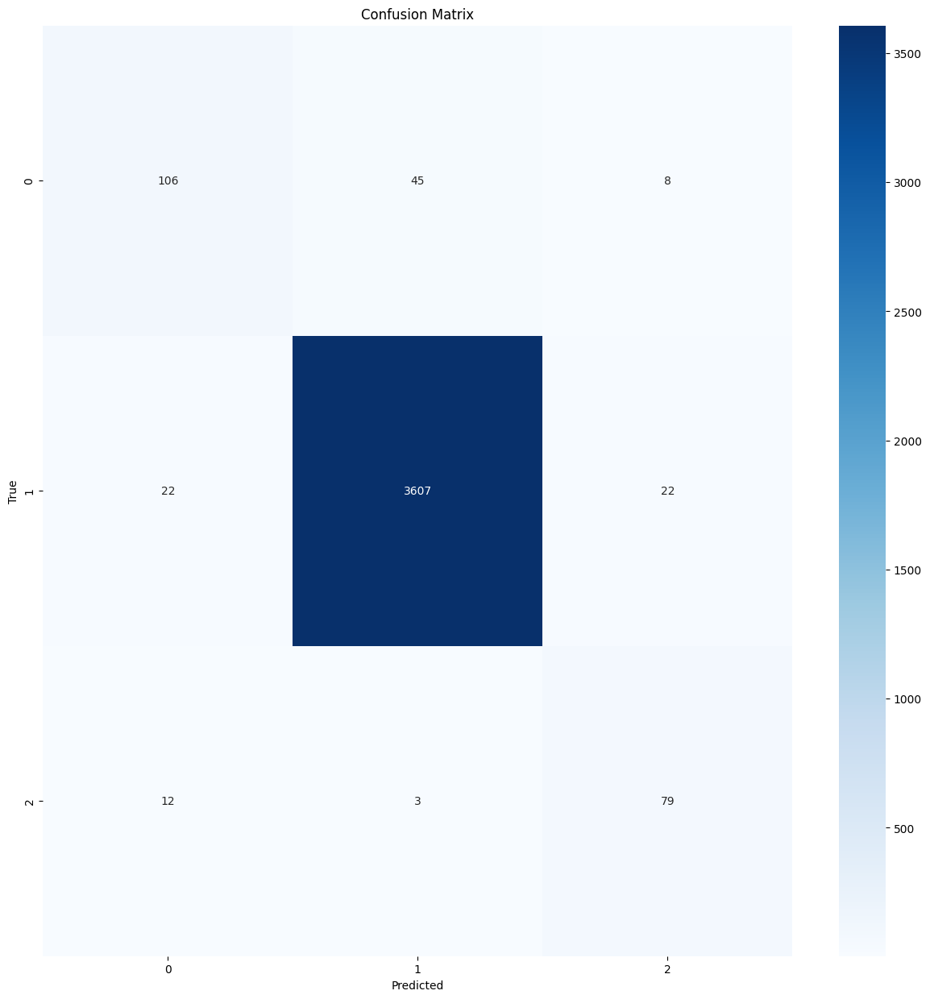

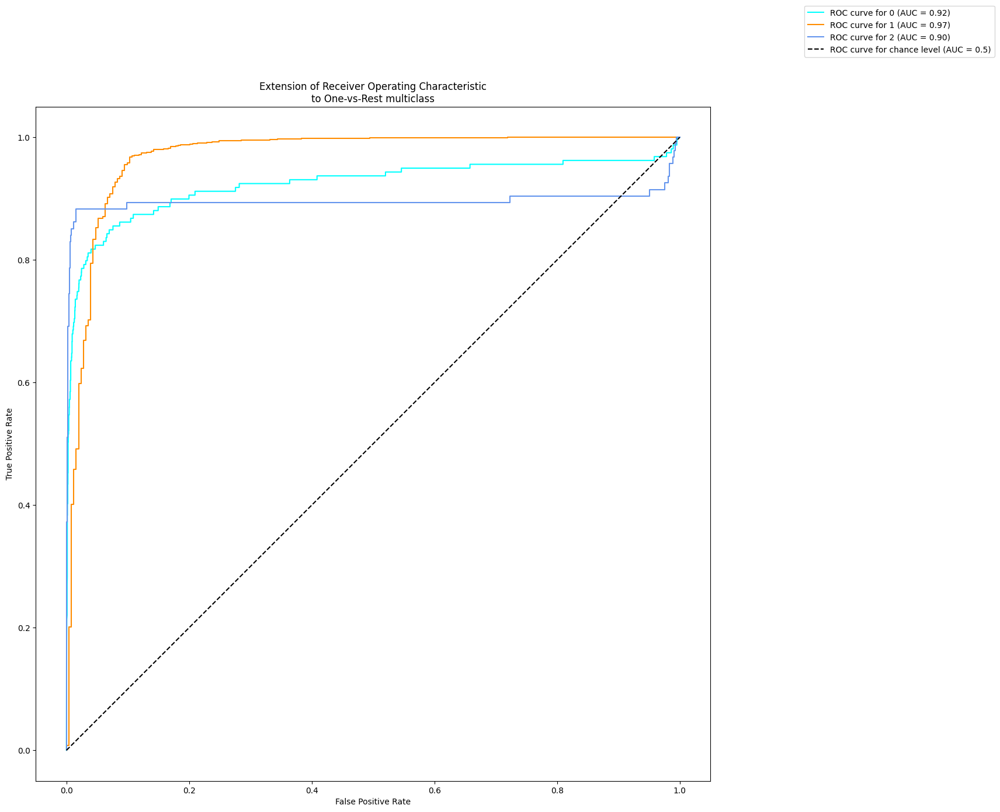

              precision    recall  f1-score   support

           0       0.76      0.67      0.71       159
           1       0.99      0.99      0.99      3651
           2       0.72      0.84      0.78        94

    accuracy                           0.97      3904
   macro avg       0.82      0.83      0.82      3904
weighted avg       0.97      0.97      0.97      3904

##################################################  Saliency Maps  ##################################################

Class 0:


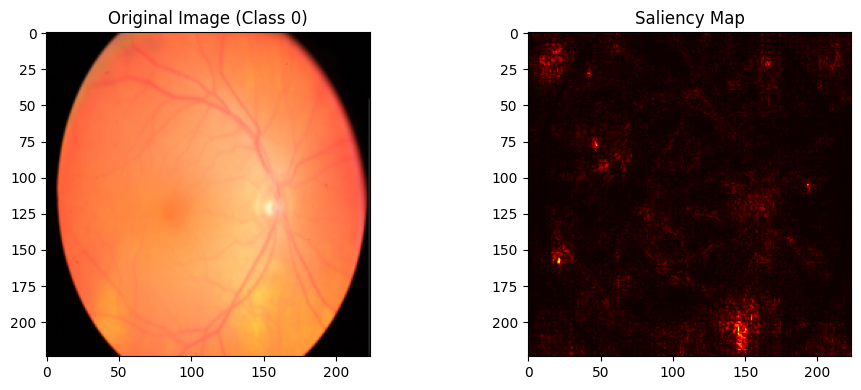

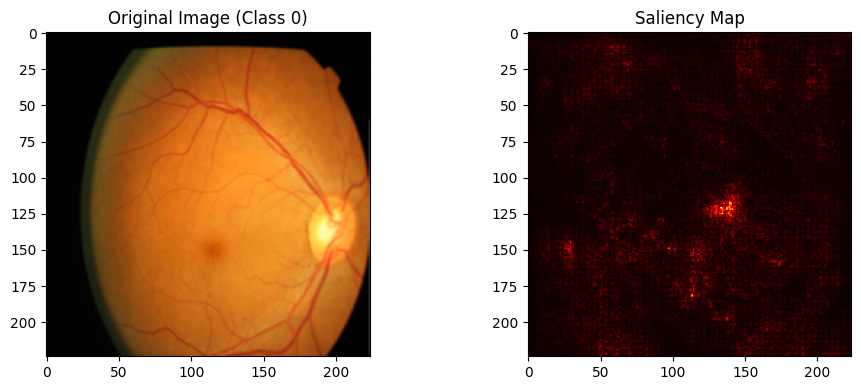

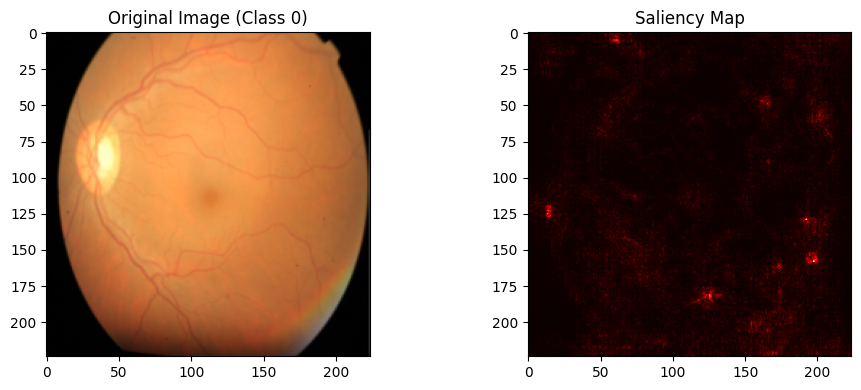

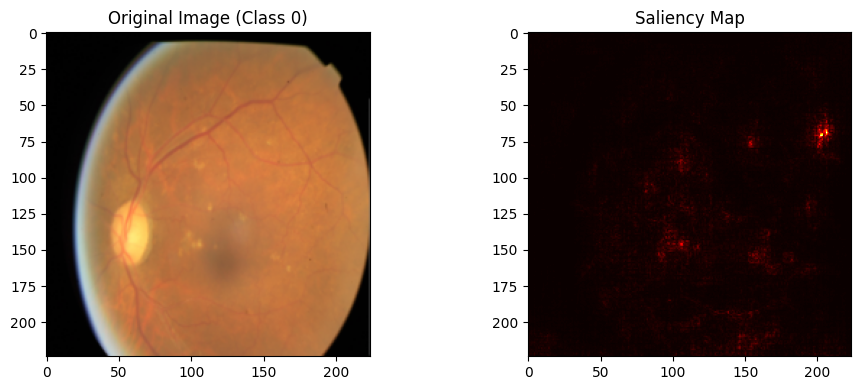

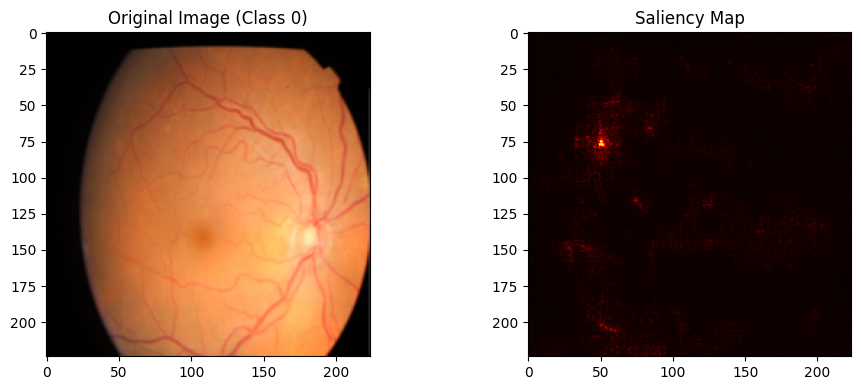

Class 1:


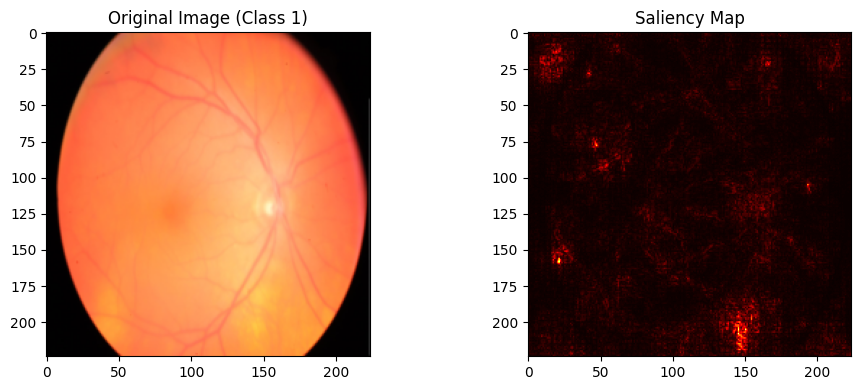

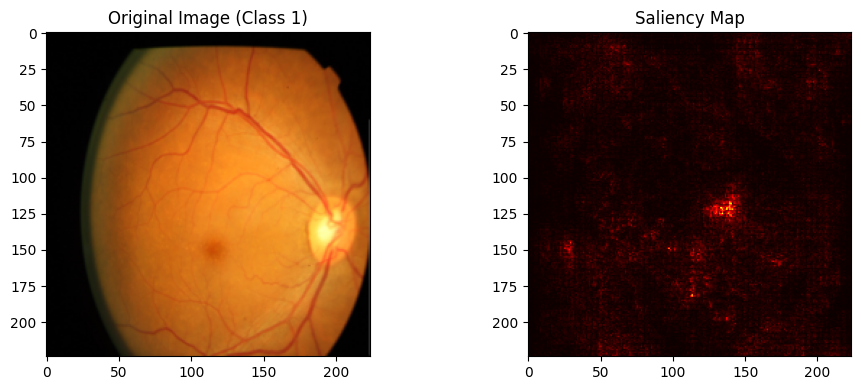

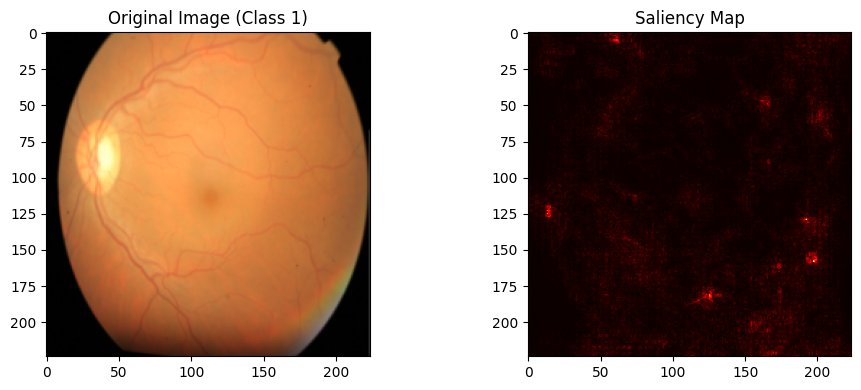

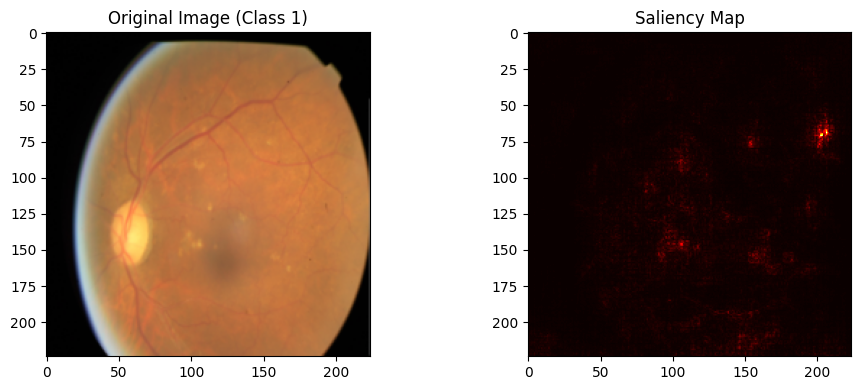

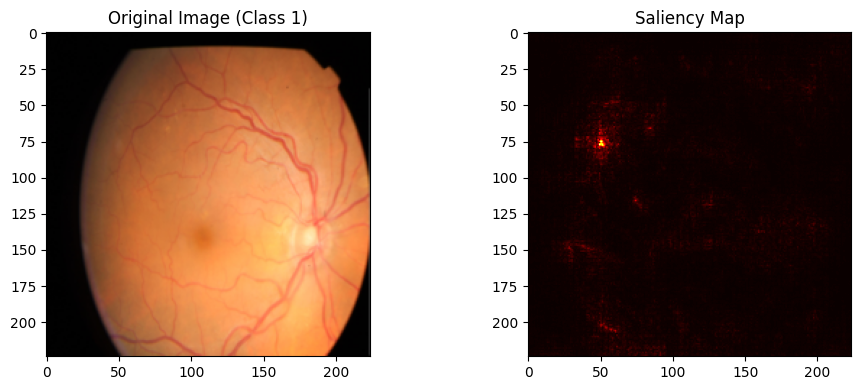

Class 2:


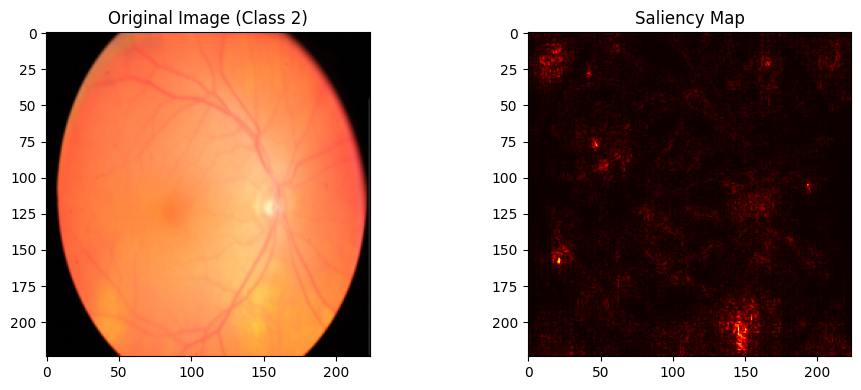

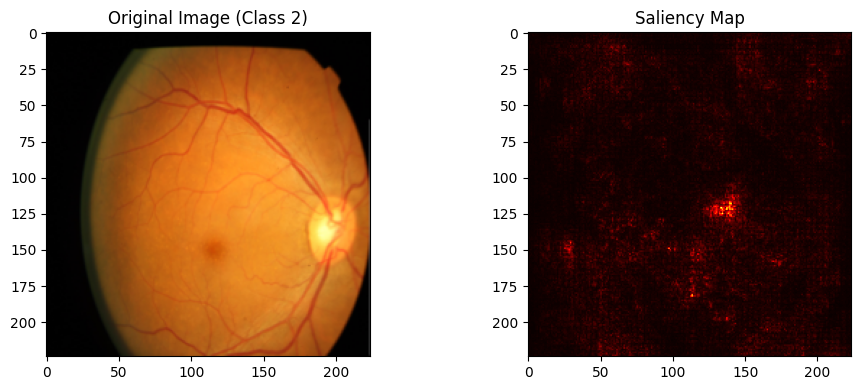

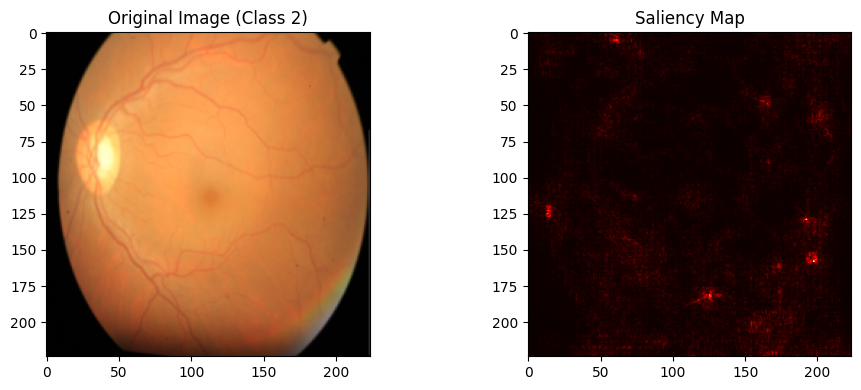

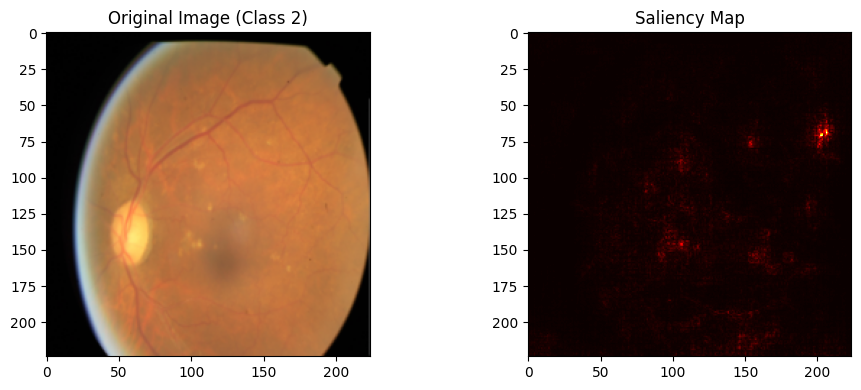

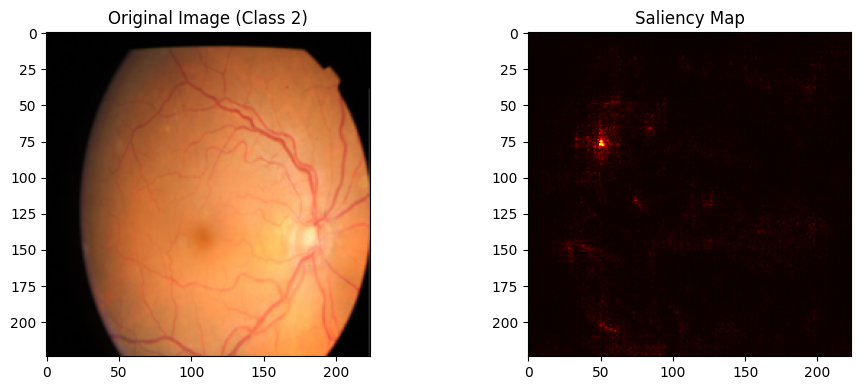

In [14]:
test(model, test_dataloader, saliency=True, device=device)

### Image quality assessment

In [15]:
# Good quality images
adequate_df = df_test[df_test['quality'] == 'Adequate']

# Bad quality images
inadequate_df = df_test[df_test['quality'] == 'Inadequate']

adequate_dataset = BRSETDataset(
    adequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

inadequate_dataset = BRSETDataset(
    inadequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

adequate_dataloader = DataLoader(adequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
inadequate_dataloader = DataLoader(inadequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

#### Adequate image quality

100%|██████████| 214/214 [01:01<00:00,  3.48it/s]


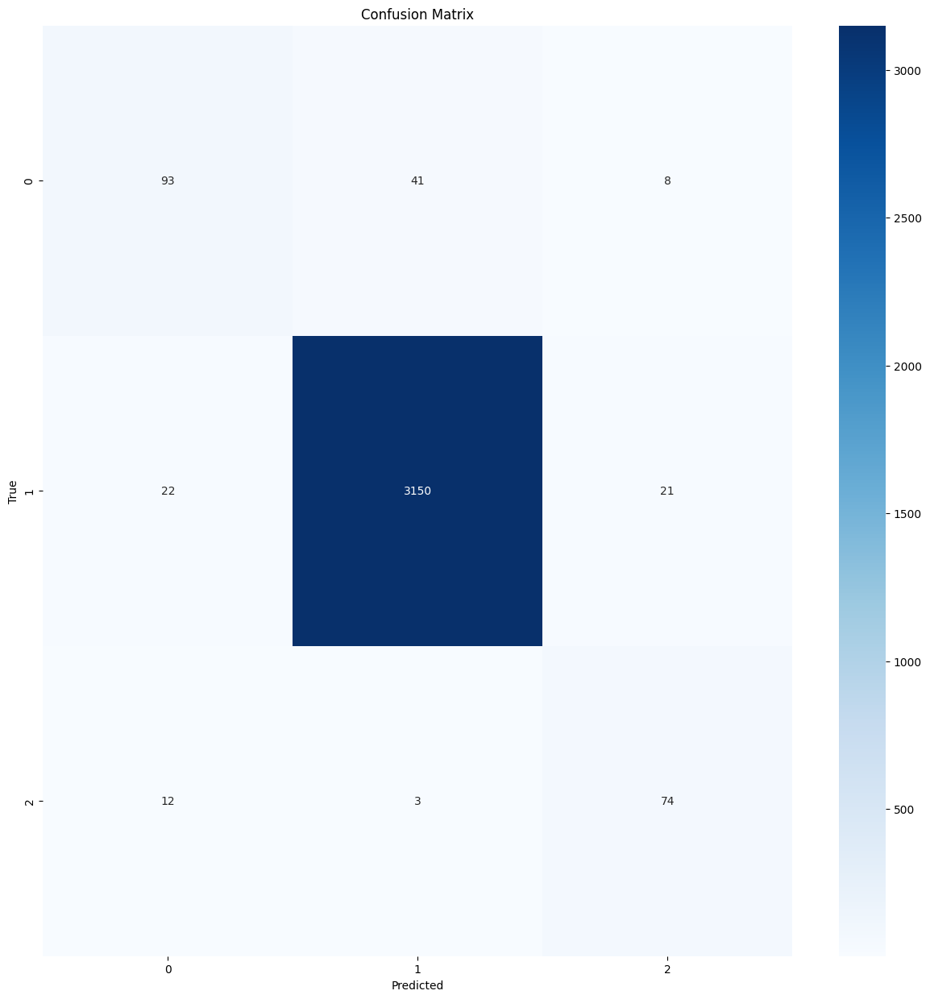

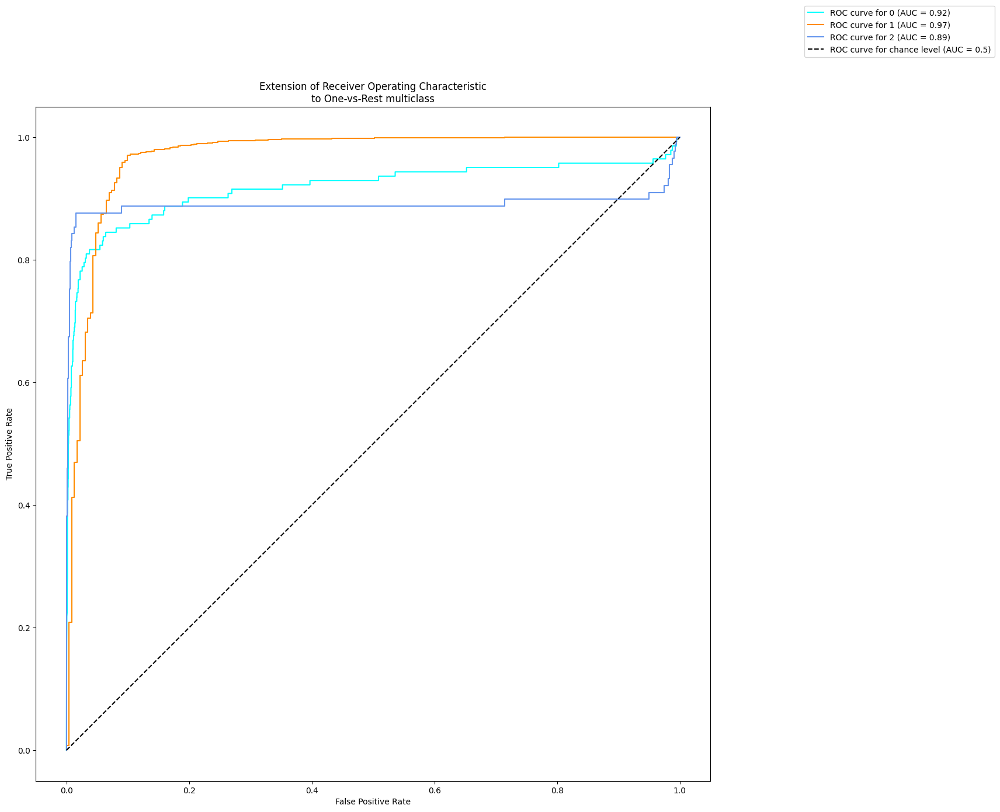

              precision    recall  f1-score   support

           0       0.73      0.65      0.69       142
           1       0.99      0.99      0.99      3193
           2       0.72      0.83      0.77        89

    accuracy                           0.97      3424
   macro avg       0.81      0.82      0.82      3424
weighted avg       0.97      0.97      0.97      3424

##################################################  Saliency Maps  ##################################################

Class 0:


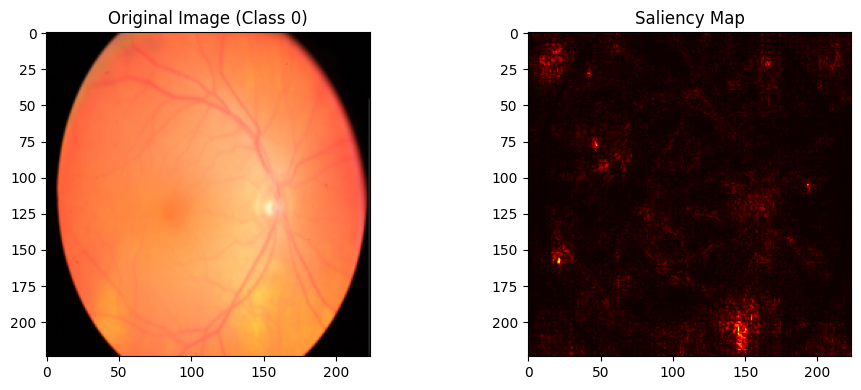

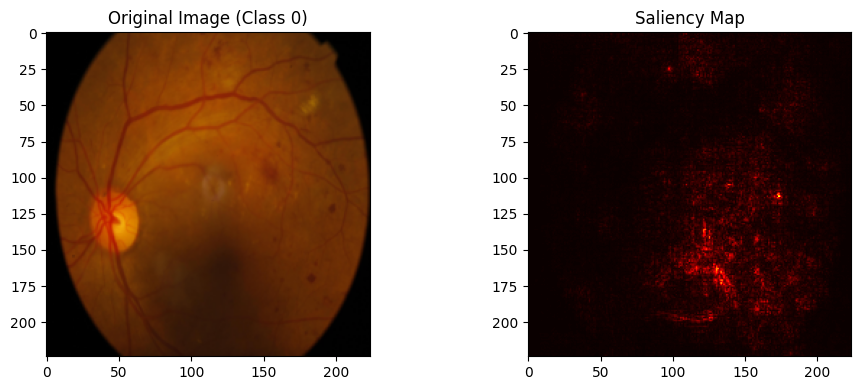

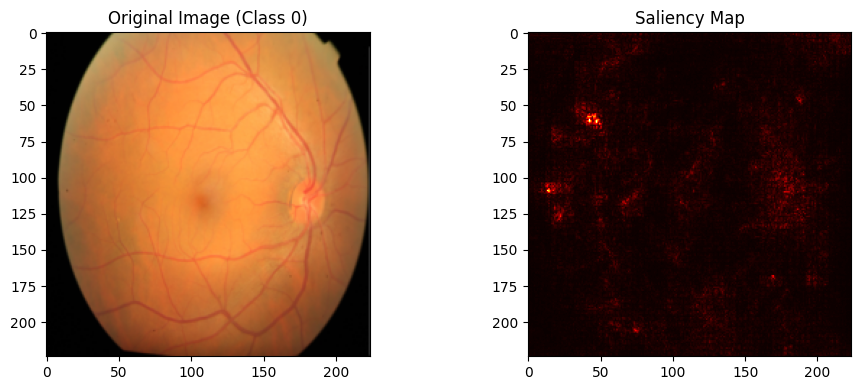

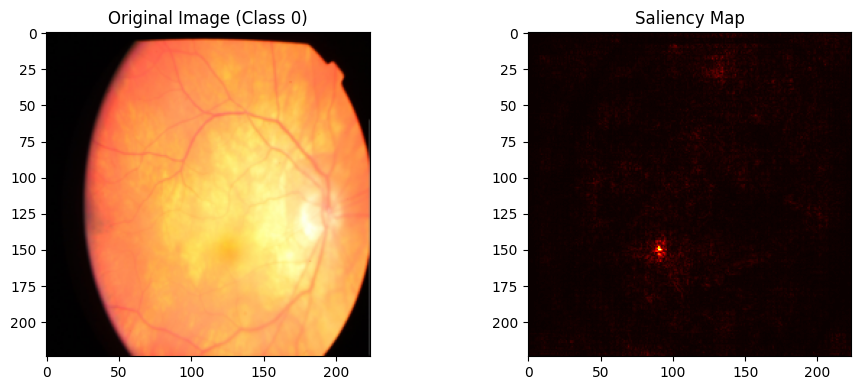

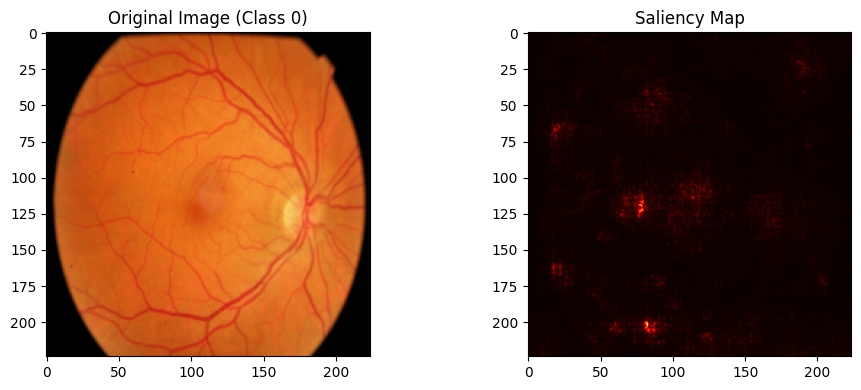

Class 1:


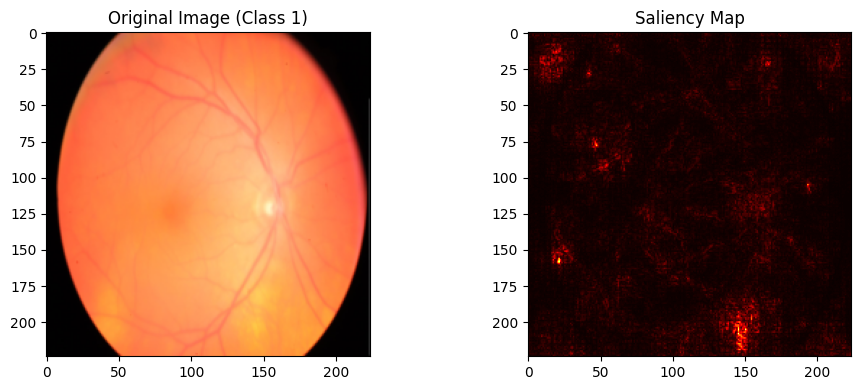

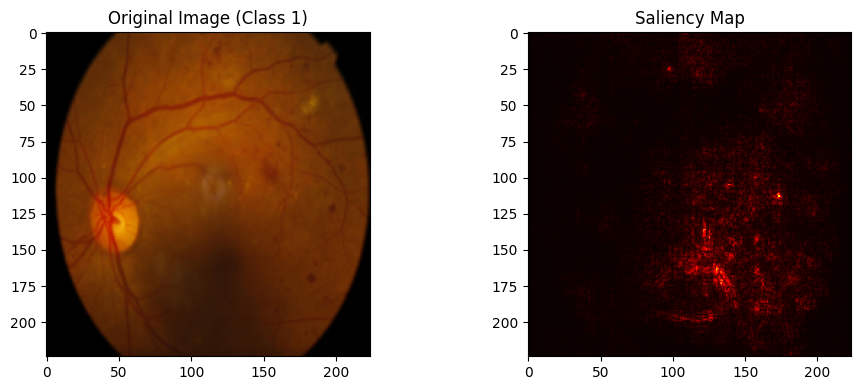

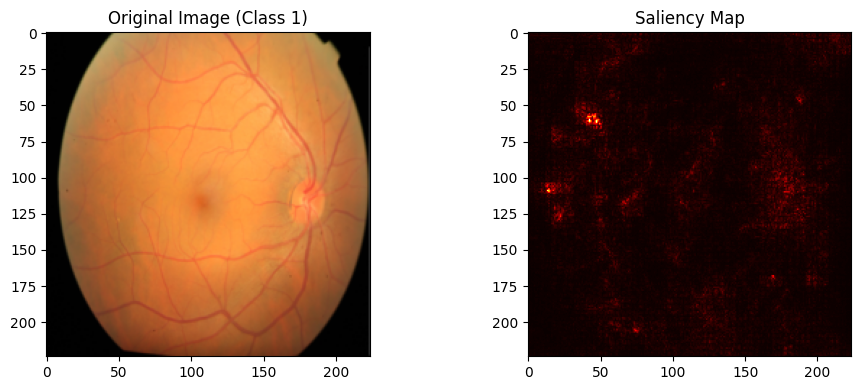

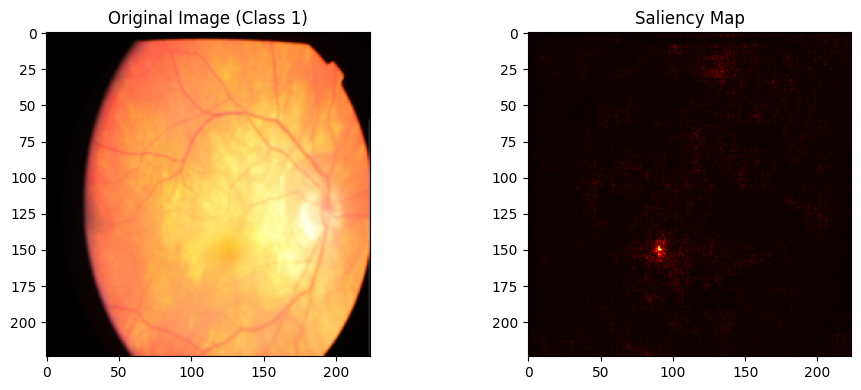

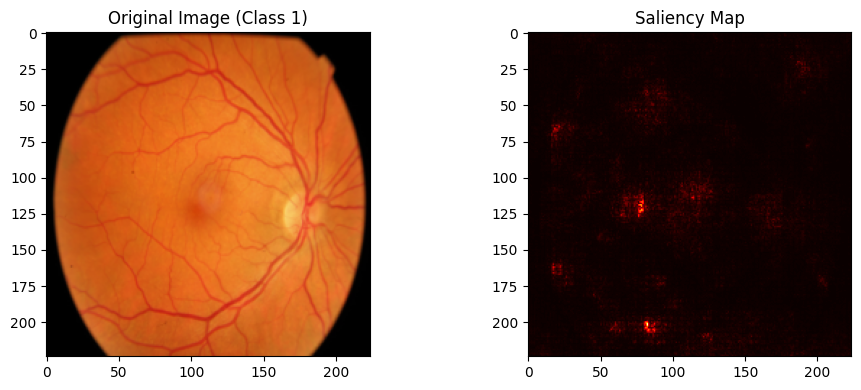

Class 2:


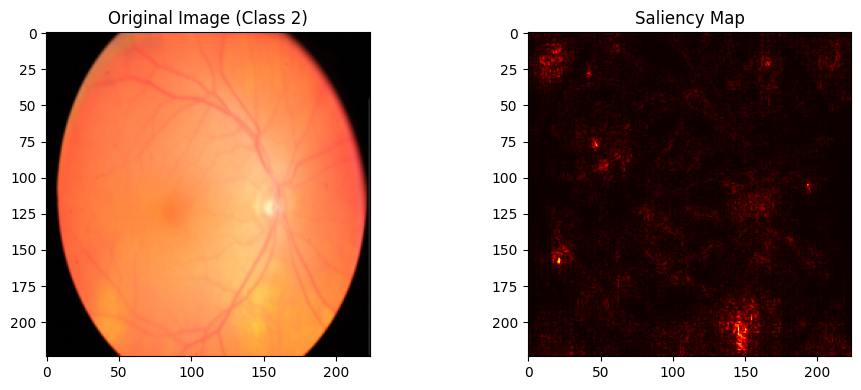

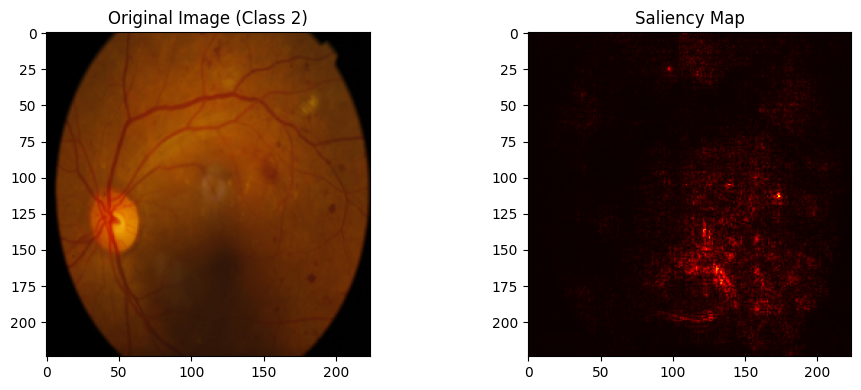

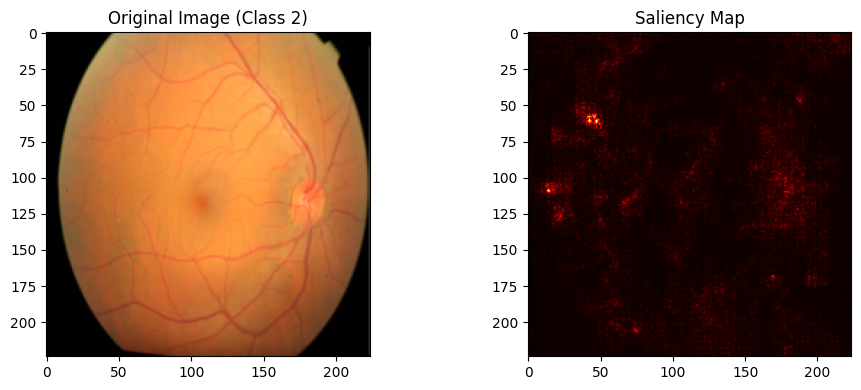

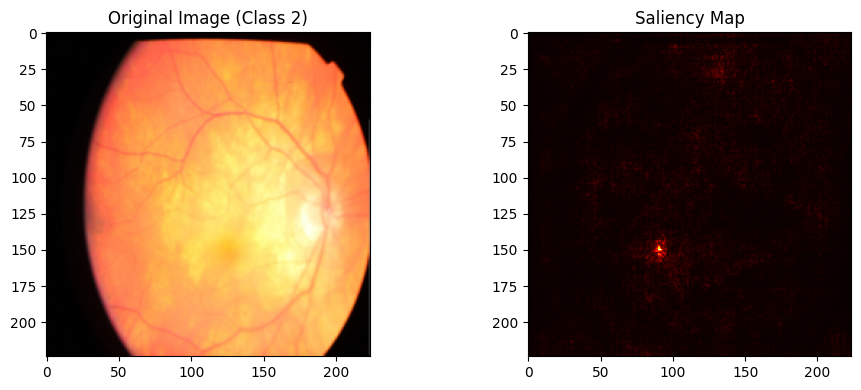

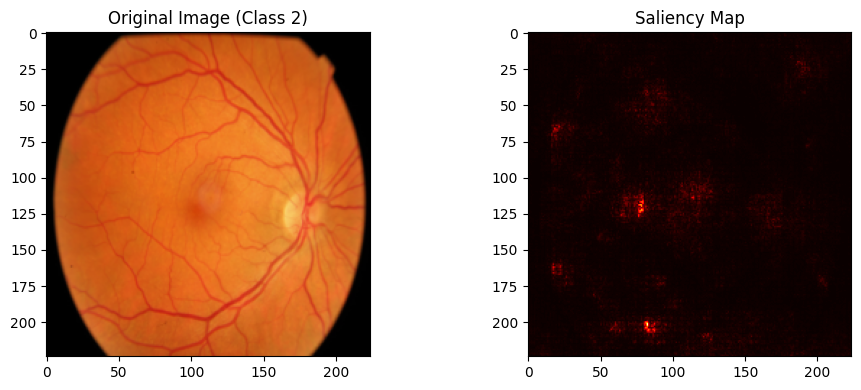

In [16]:
test(model, adequate_dataloader, saliency=True, device=device, save=True)

#### Inadequate image quality

100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


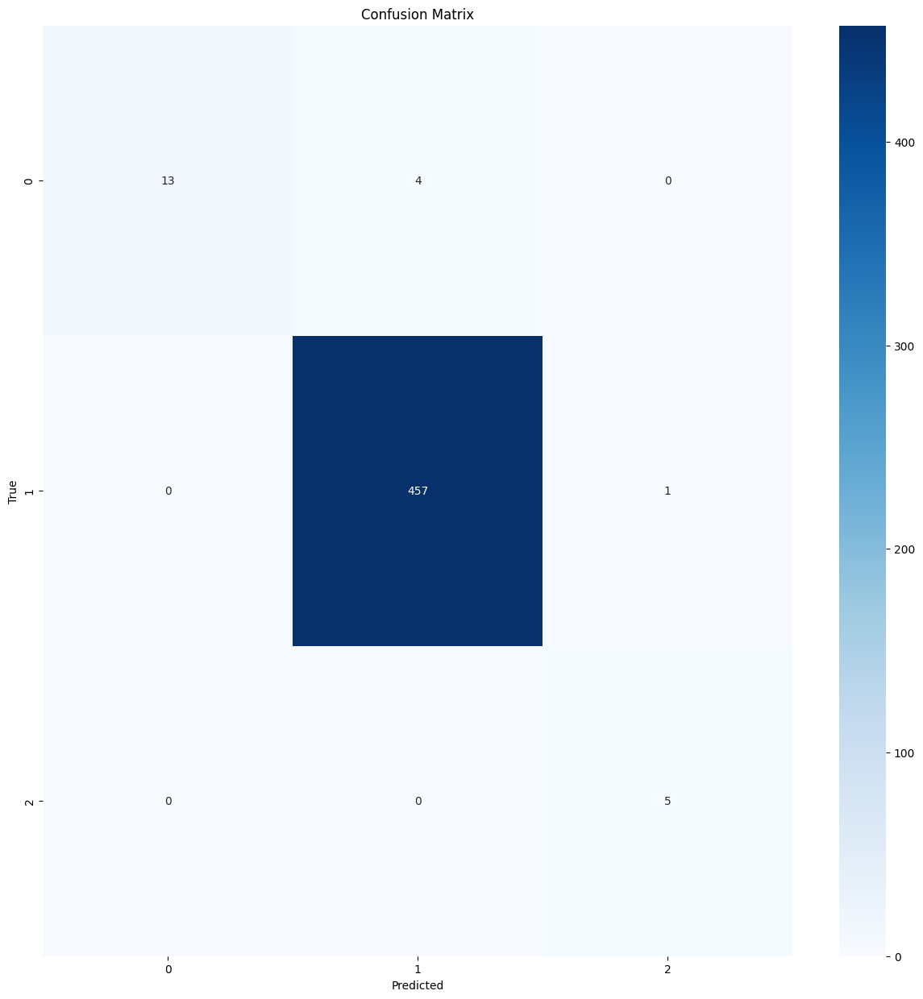

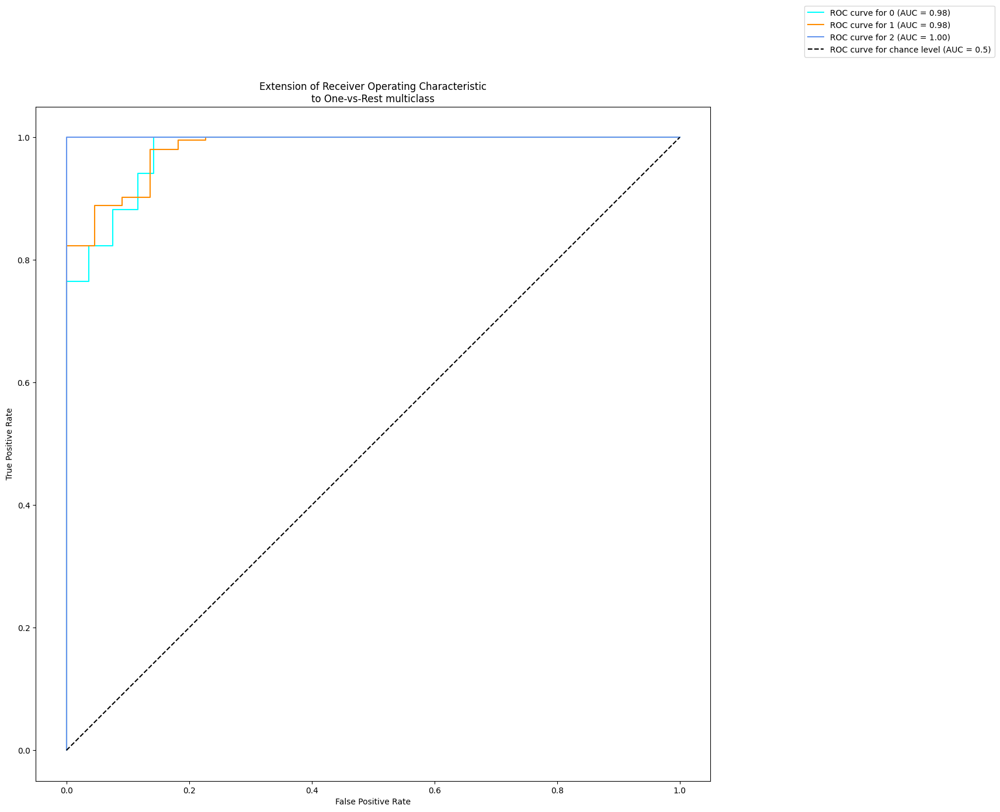

              precision    recall  f1-score   support

           0       1.00      0.76      0.87        17
           1       0.99      1.00      0.99       458
           2       0.83      1.00      0.91         5

    accuracy                           0.99       480
   macro avg       0.94      0.92      0.92       480
weighted avg       0.99      0.99      0.99       480

##################################################  Saliency Maps  ##################################################

Class 0:


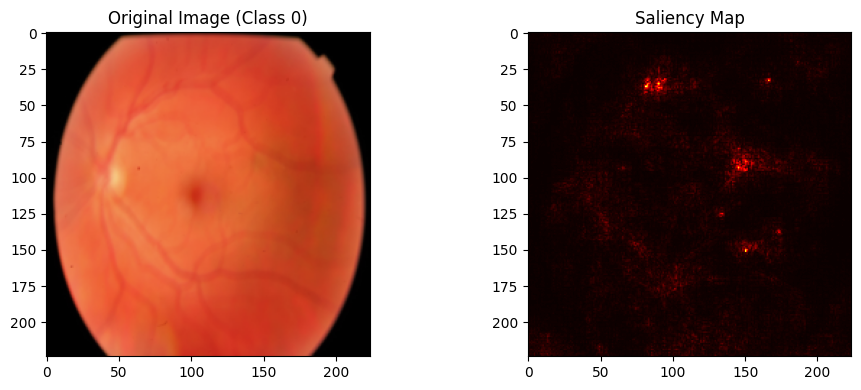

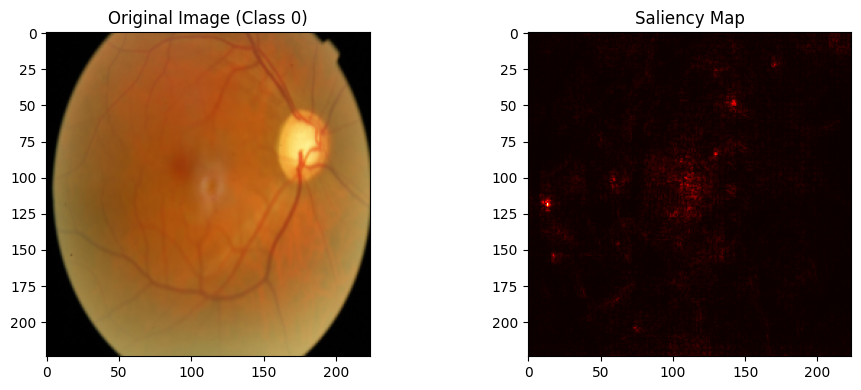

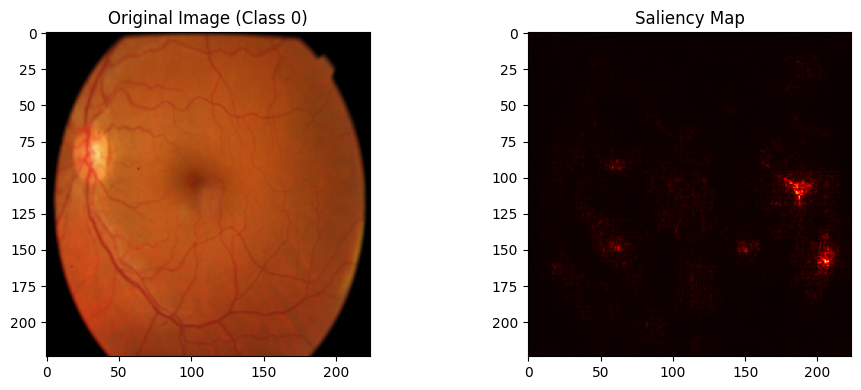

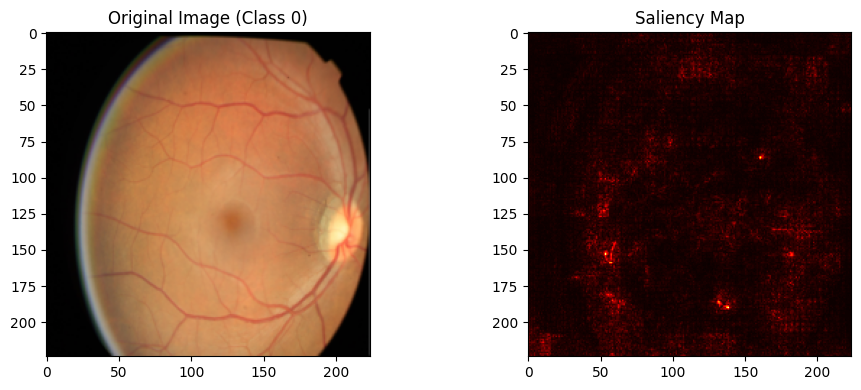

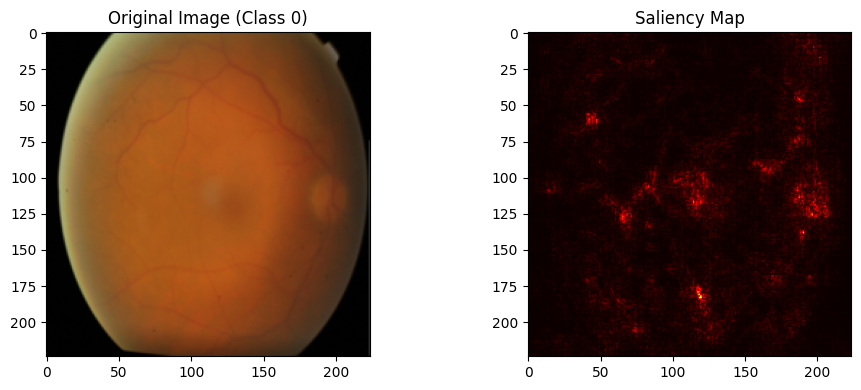

Class 1:


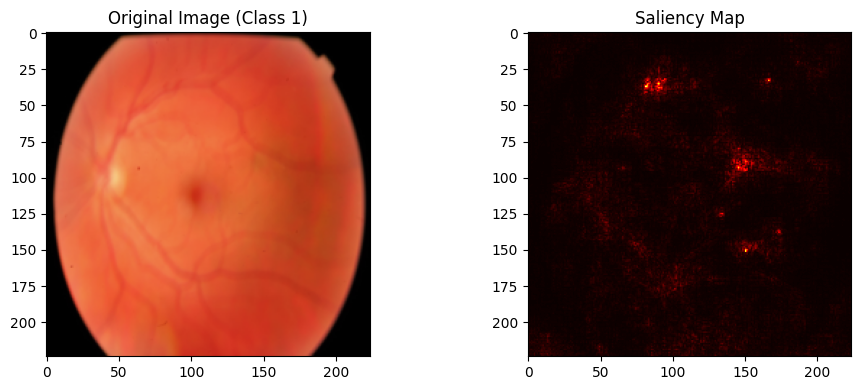

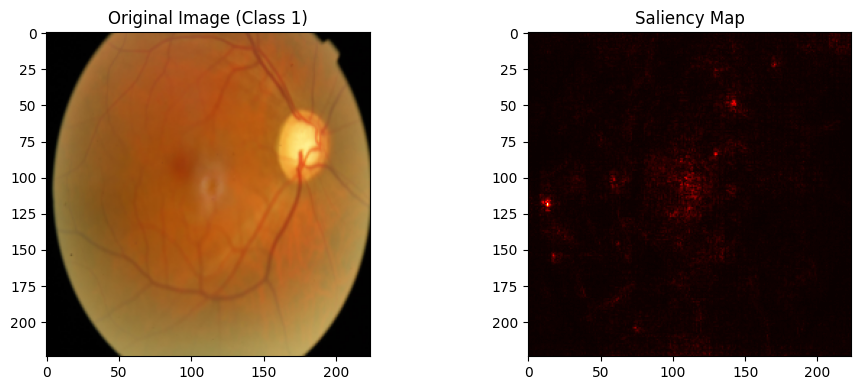

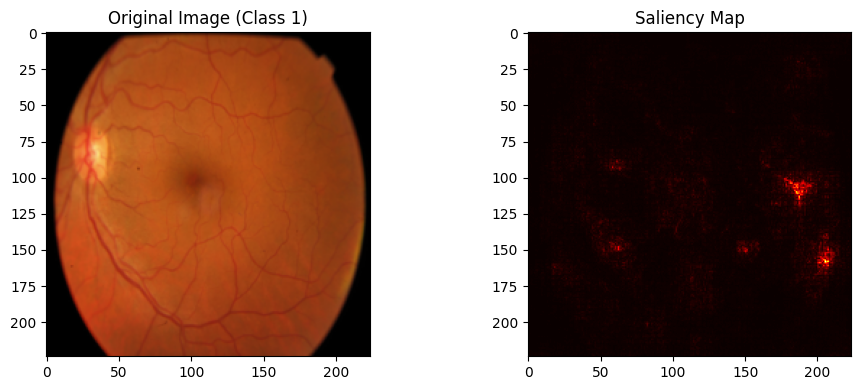

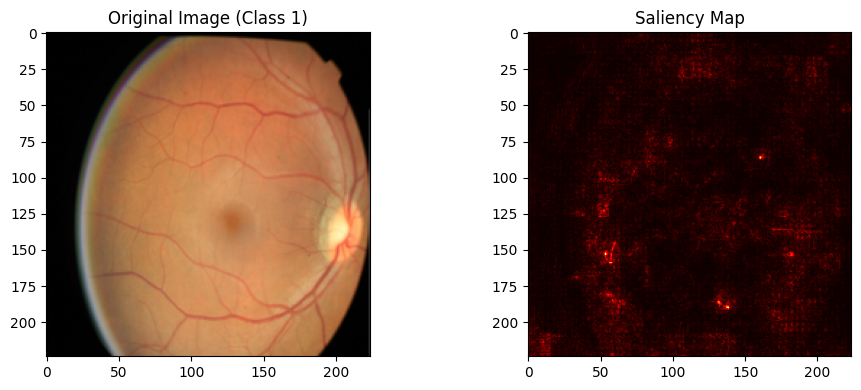

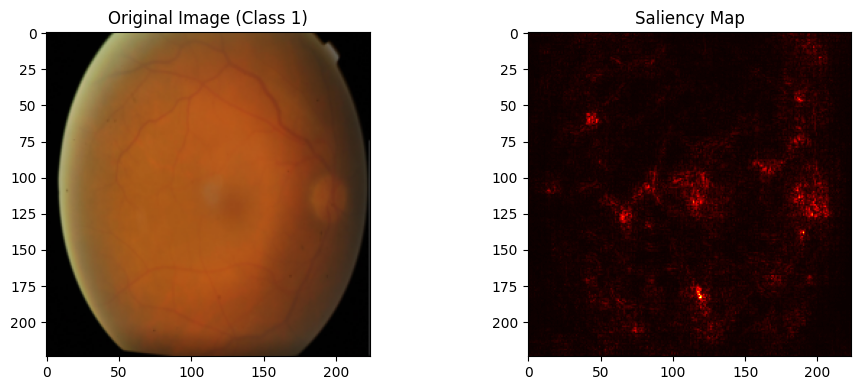

Class 2:


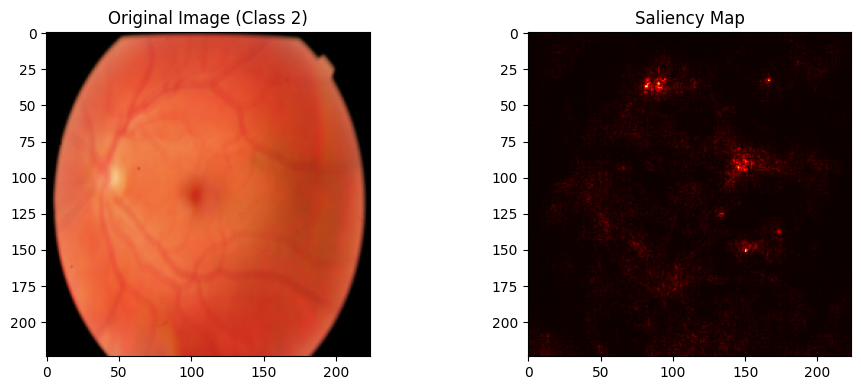

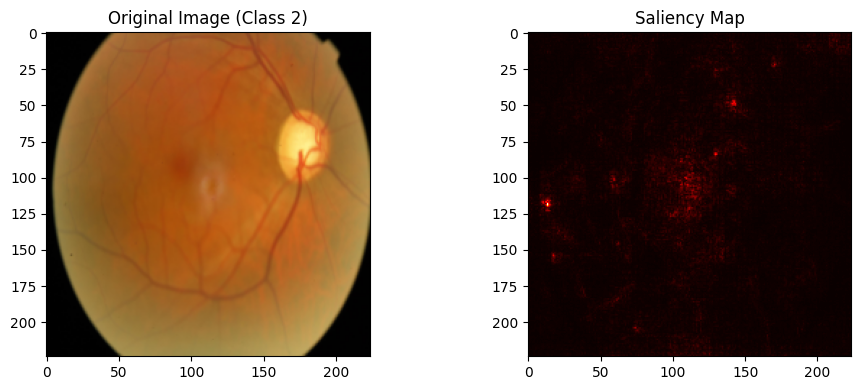

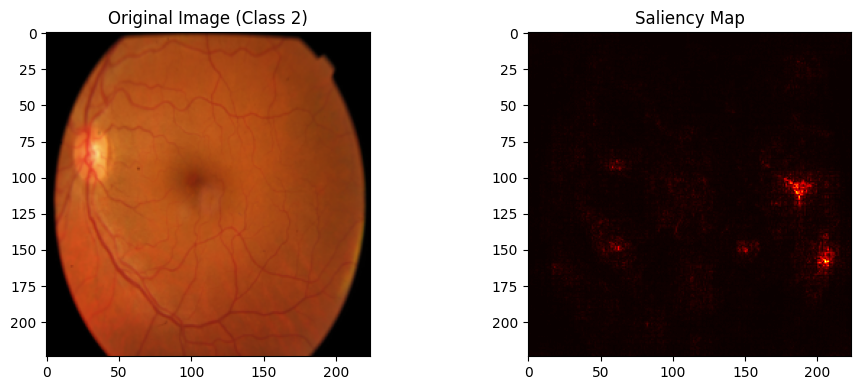

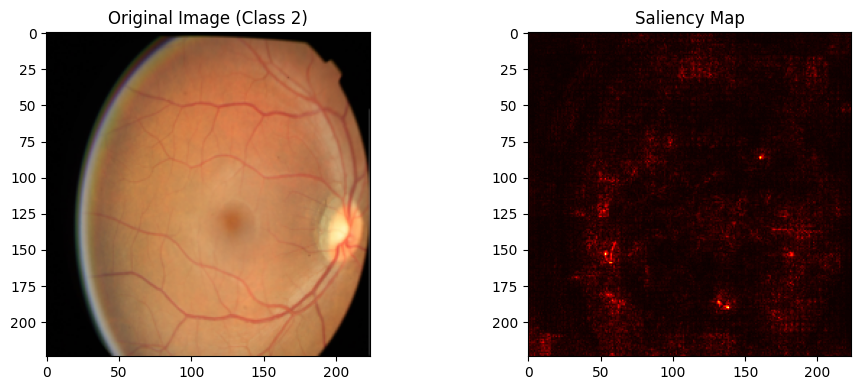

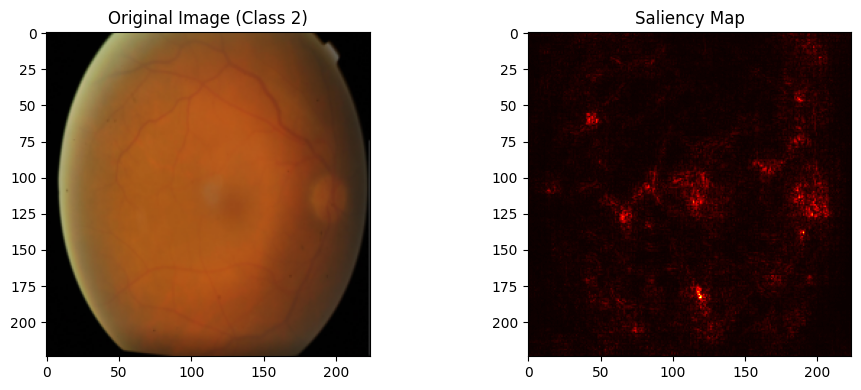

In [17]:
test(model, inadequate_dataloader, saliency=True, device=device)